In [1]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
data = pd.read_csv(r"C:\Users\HIM\Desktop\golu\Dataset.csv")

In [3]:
standard = pd.read_csv(r"standard.csv")

### Other numerical features include "Average_hours" , "Price" , "stars". We will add them separetly with  our data and in end will add all these together.In this notebook will work with standard data.

In [4]:
standard["average"] = data.average_hours

### For evaluation ill be using silhouette score and hartigans index. I'll take sample due to limitation of resource.

In [5]:
sample  = standard.sample(frac=.30,random_state=2)

In [6]:
from __future__ import print_function

from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
def silhoute(sample , n):
    range_n_clusters = n
    X =sample.values

    for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 9)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    #ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, random_state=10)
        cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
        silhouette_avg = silhouette_score(X, cluster_labels)
        print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
            ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
        colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X[:, 0], X[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
        centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

        plt.show()

For n_clusters = 6 The average silhouette_score is : 0.509114557717


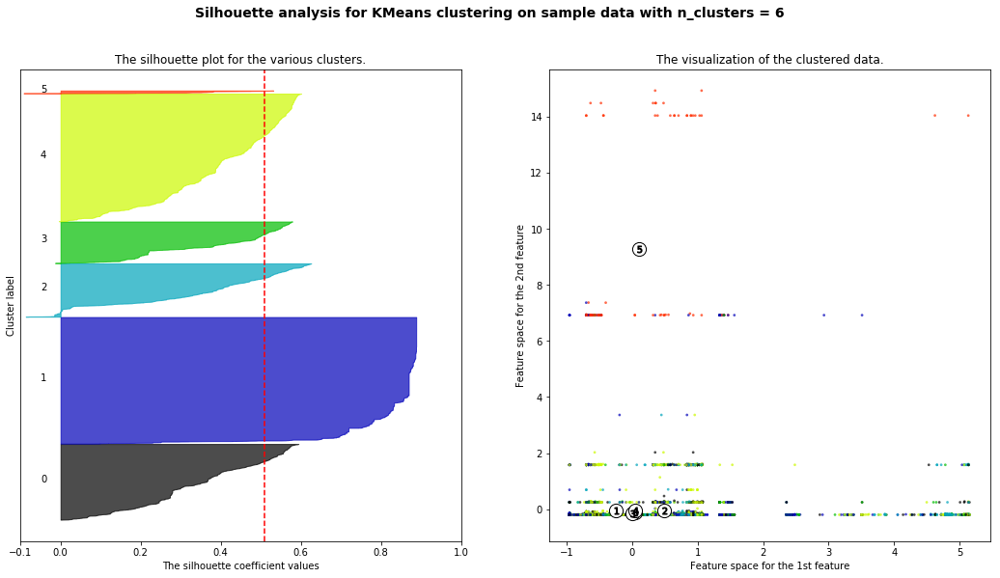

For n_clusters = 7 The average silhouette_score is : 0.516307615628


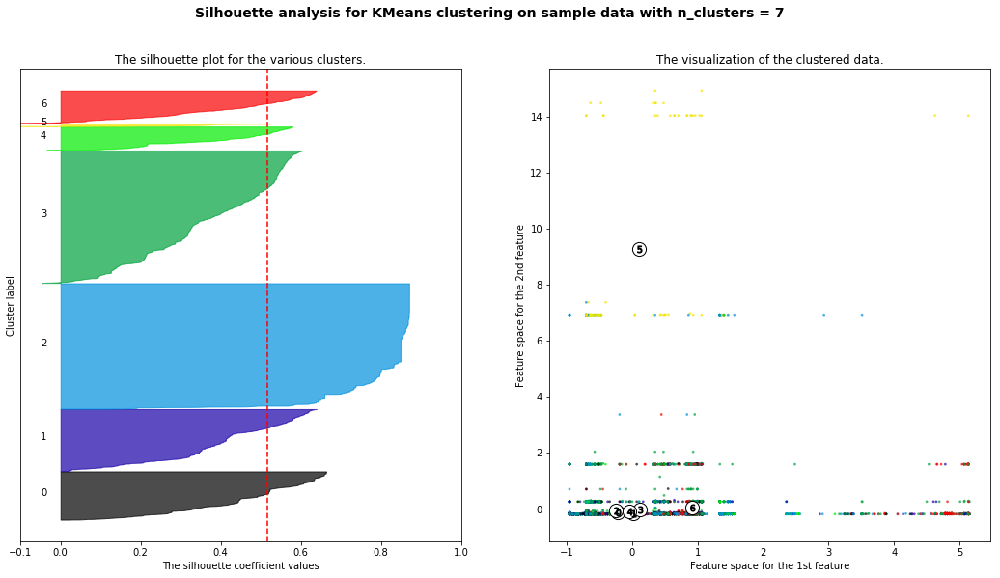

For n_clusters = 8 The average silhouette_score is : 0.511089192138


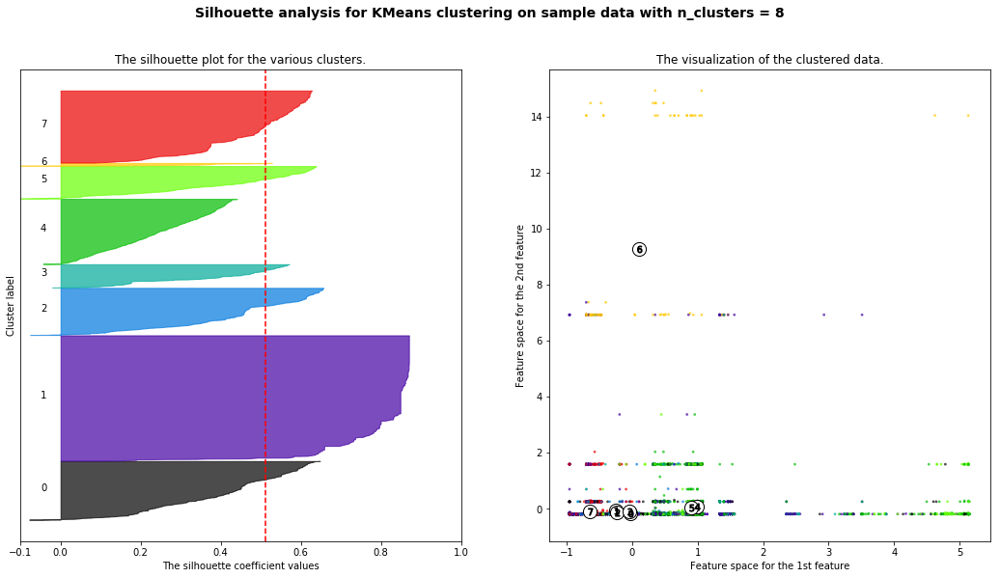

For n_clusters = 9 The average silhouette_score is : 0.48113646582


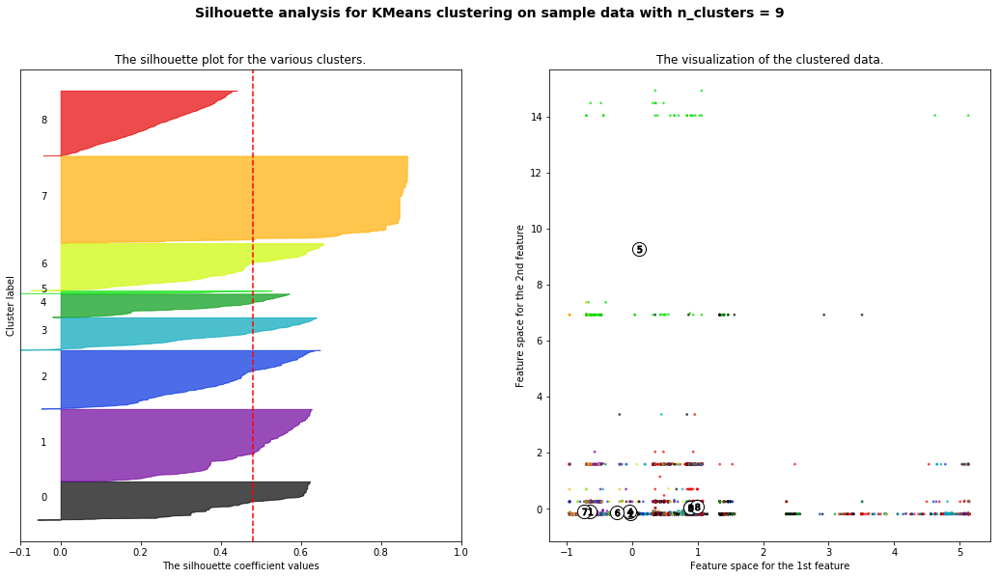

For n_clusters = 10 The average silhouette_score is : 0.467224820462


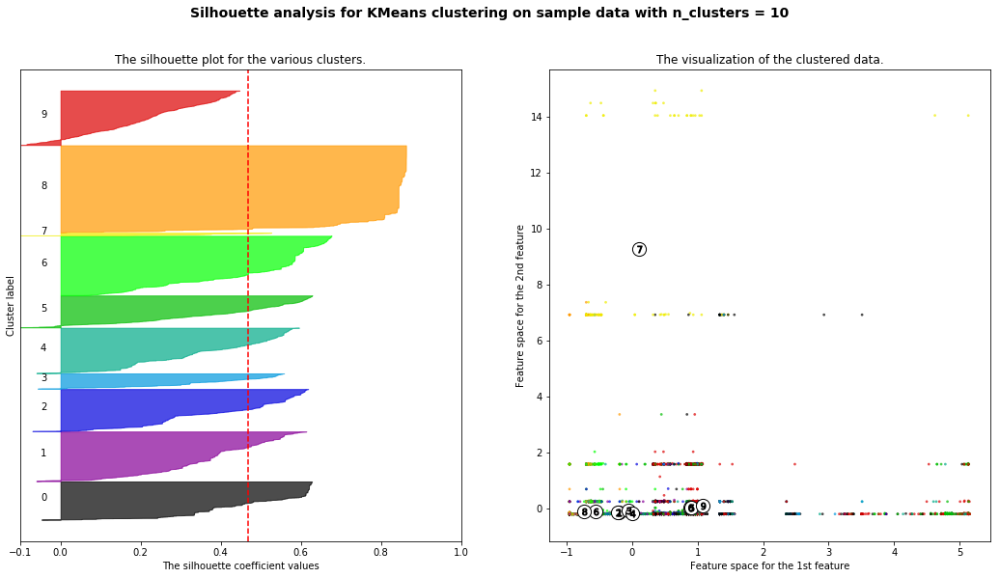

In [41]:
silhoute(sample,[6,7,8,9,10])

### Hartigans index

In [11]:
from sklearn.cluster import KMeans
from numpy import *

def hartigan_K(list_of_tuples, threshold = 12):
    # 'list_of_tuples' is a list containing the points you want to cluster
    # 'threshold' optimizes goodness of fit values
    #     Hartigan recommends setting threshold to 10, but Chiang & Mirkin confirm up to 12
    # returns integer, "correct" number of clusters
    
    inertia_list = zeros(len(list_of_tuples)+1) # initializes for maximum possible clusters
    num = 0                                     # counter
    H_Rule = threshold+1                        # simply initializes above threshold to meet 'while' condition
    
    # NOTE: 'inertia' is equivalent to the sum of within-cluster distances to centroids
    
    while num < len(list_of_tuples) and H_Rule > threshold:
        kmn = KMeans(n_clusters = num+1)
        kmn.fit(list_of_tuples)
        inertia_list[num+1]+=kmn.inertia_
        if num > 0:
            H_Rule = ((float(inertia_list[num])/inertia_list[num+1])-1)*(len(list_of_tuples)-(num)-1)
        num+=1
    
    if H_Rule > threshold:
      num+=1
    # NOTE: if while-loop reaches the number of K-Means clusters equal to the length of list_of_tuples
    # without hitting the threshold, then function returns trivial solution that there are N clusters
    # (where N is the number of points under observation)
    
    return num-1


In [45]:
hartigan_K(sample)

51

### lets check silhouete score for k=51

For n_clusters = 51 The average silhouette_score is : 0.52560176044


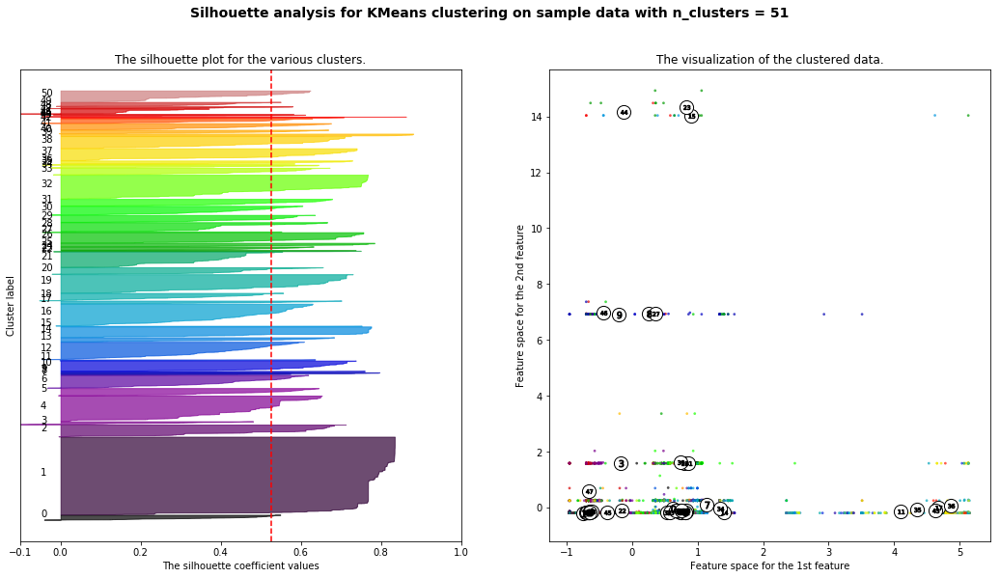

In [48]:
silhoute(sample,[51])

### So score is better for k= 51 than all other k.
### Note : value of hartigans may change due to working of kmeans but it will be close to optimal value only

### Now lets plot these points in 3d using plotly

In [6]:
from sklearn.cluster import KMeans
def kme(sample,n):
    kmeans = KMeans(n_clusters=n, random_state=0).fit(sample)
    return kmeans.labels_

In [22]:
#from IPython.core.interactiveshell import InteractiveShell
#InteractiveShell.ast_node_interactivity = "all"
import plotly.offline as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
py.init_notebook_mode(connected=True)
def plot(x,y,z,color):
    trace1 = go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='markers',
        marker=dict(
        size=10,
        color=color,     # set color to an array/list of desired values
        colorscale=[[0, 'rgb(166,2,227)'], [0.25, 'rgb(31,120,180)'], [0.45, 'rgb(178,223,138)'], [0.65, 'rgb(51,160,44)'], [0.85, 'rgb(251,154,153)'], [1, 'rgb(227,26,28)']],   # choose a colorscale
        opacity=0.8
    )
    )

    data = [trace1]
    layout = go.Layout(
    margin=dict(
        l=0,
        r=0,
        b=0,
        t=0
        )
        )
    fig = go.Figure(data=data, layout=layout)
    py.iplot(fig, filename='3d-scatter-colorscale')

In [23]:
label = kme(sample,41)
plot(sample.Amenties,sample.Food,sample.average,label)

### now lets add price in place of averag hours

In [24]:
standard = standard.drop(["average"],axis=1)
standard["price"] = data.pricelevel

### lets take sample

In [25]:
sample  = standard.sample(frac=.30,random_state=2)

For n_clusters = 5 The average silhouette_score is : 0.546695164901


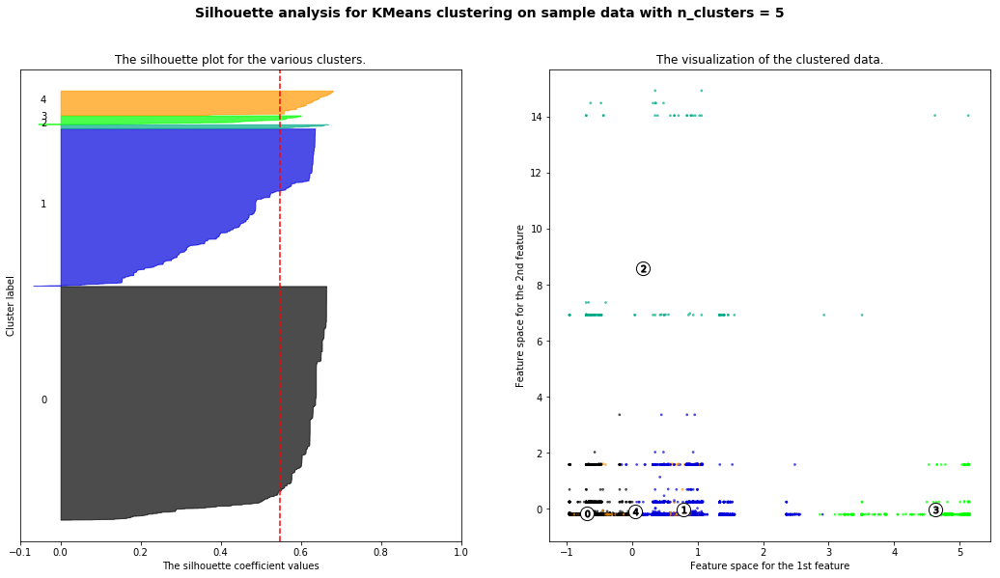

For n_clusters = 6 The average silhouette_score is : 0.600653817312


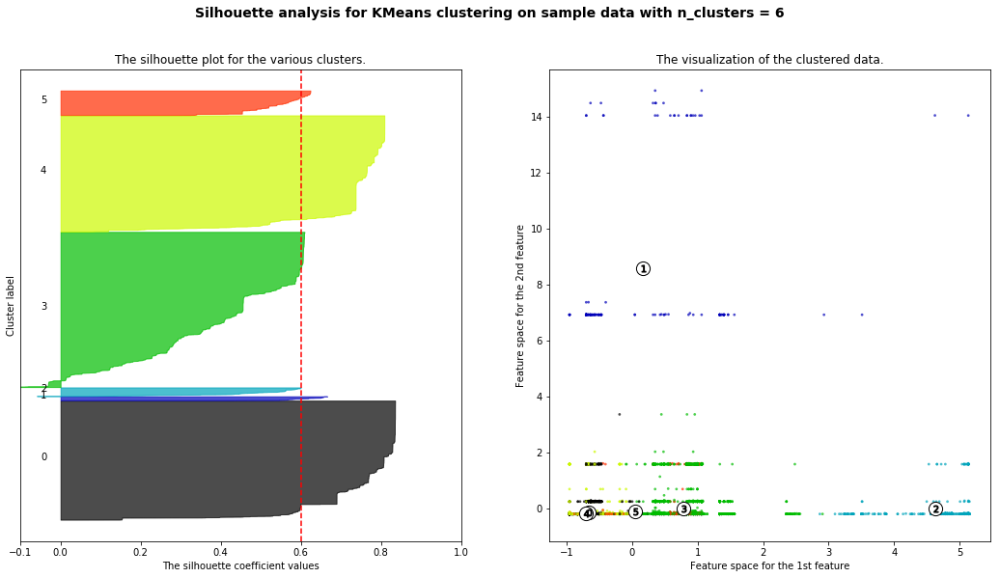

For n_clusters = 7 The average silhouette_score is : 0.643792942298


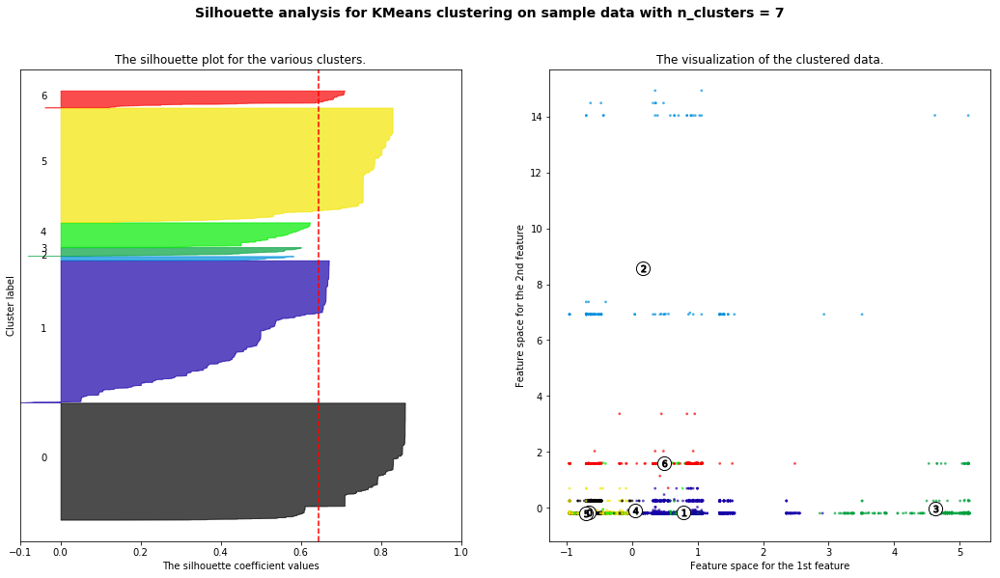

For n_clusters = 8 The average silhouette_score is : 0.646112824628


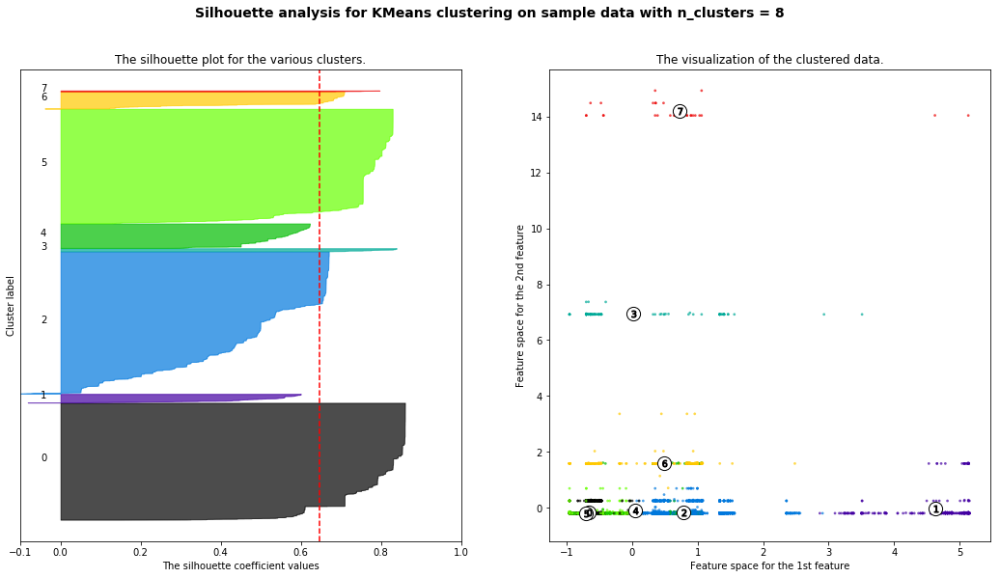

For n_clusters = 9 The average silhouette_score is : 0.689566114449


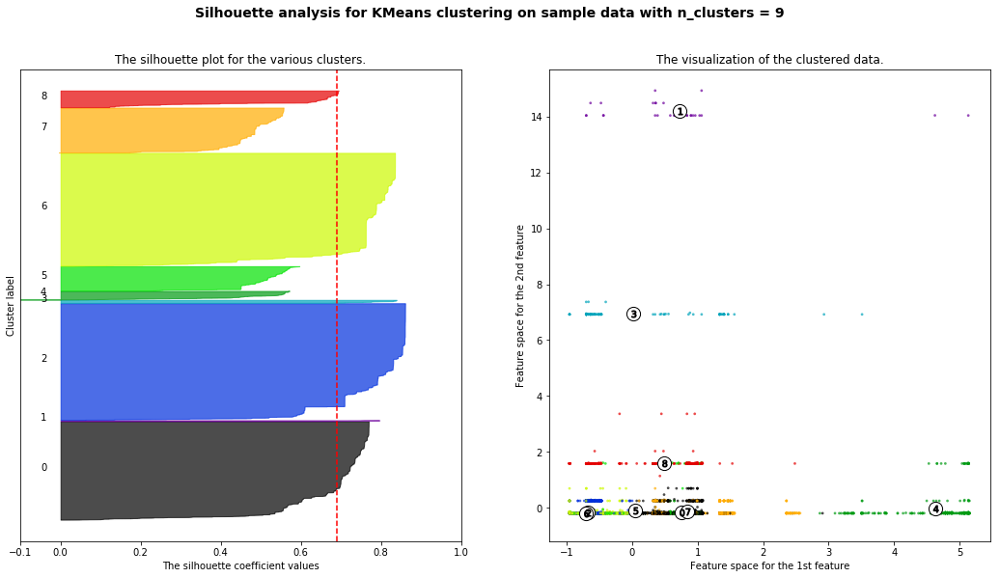

For n_clusters = 10 The average silhouette_score is : 0.694387604821


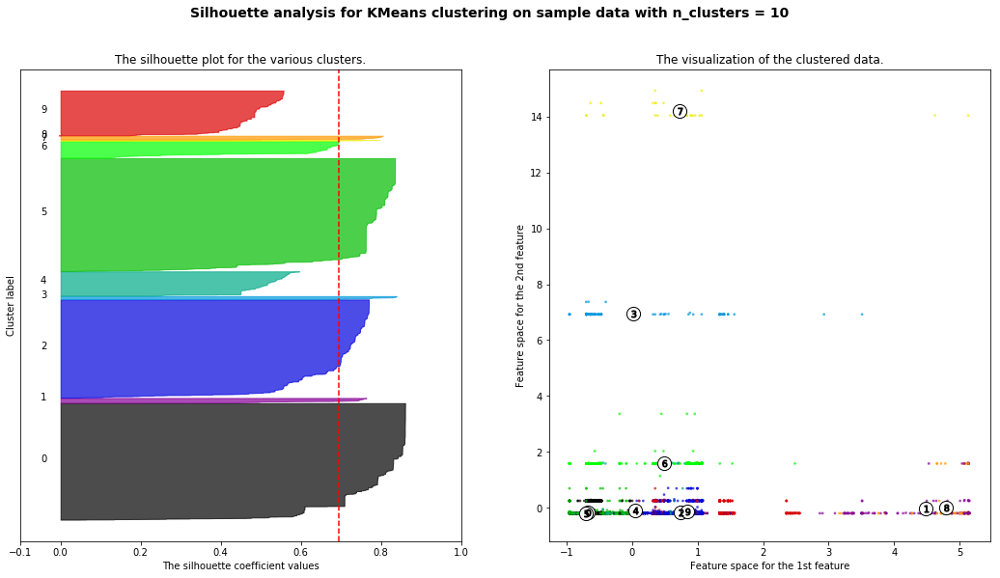

In [10]:
silhoute(sample=sample,n=[5,6,7,8,9,10])

In [12]:
hartigan_K(sample)

30

For n_clusters = 30 The average silhouette_score is : 0.694732498391


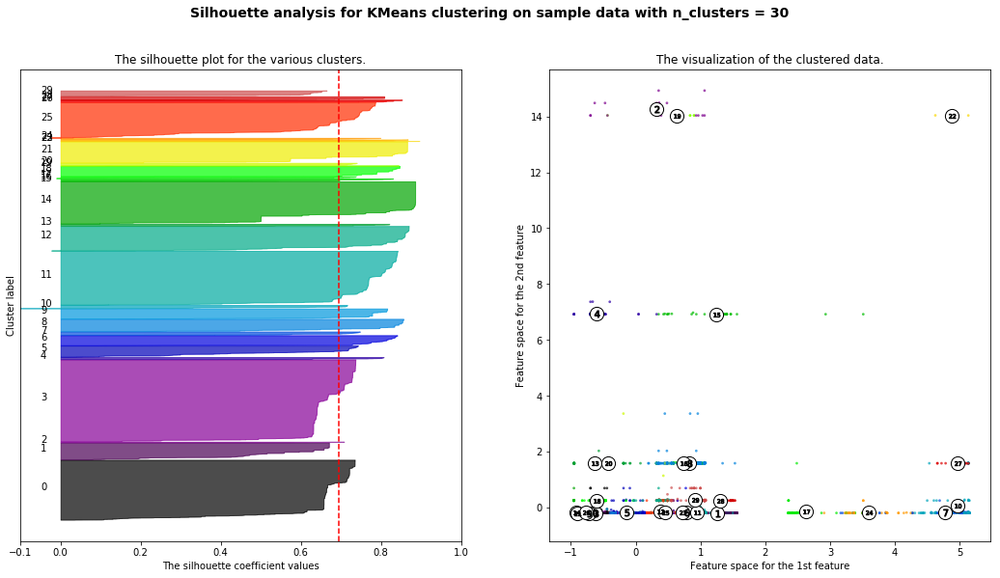

In [13]:
silhoute(sample,[30])

### Still good score.lets plot them

In [26]:
label = kme(sample,30)
plot(sample.Amenties,sample.Food,sample.price,label)

### Its time to add stars

In [27]:
standard= standard.drop(["price"],axis=1)
standard["stars"] = data.stars

In [28]:
sample= standard.sample(frac=.30,random_state=2)

For n_clusters = 5 The average silhouette_score is : 0.456625164248


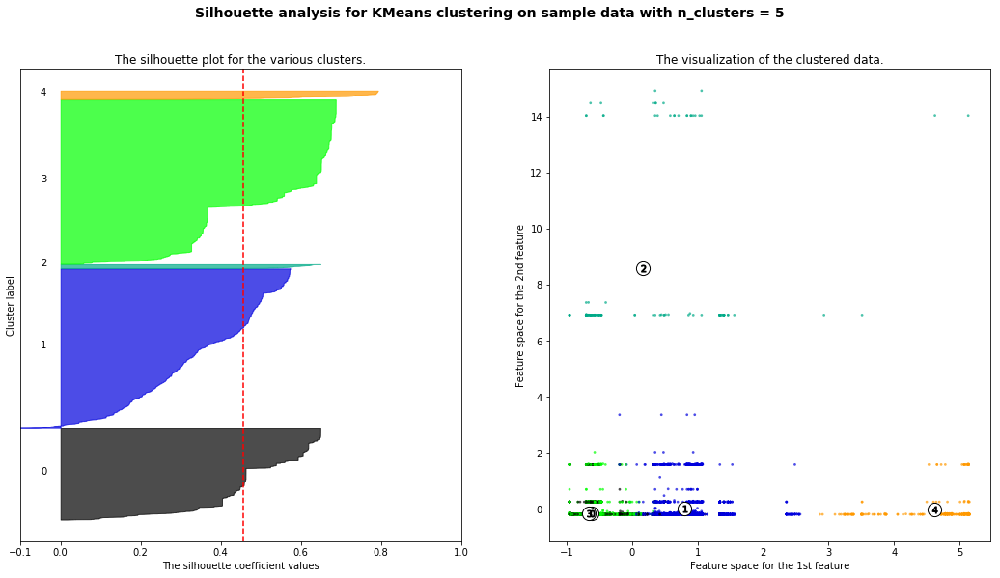

For n_clusters = 6 The average silhouette_score is : 0.459661595786


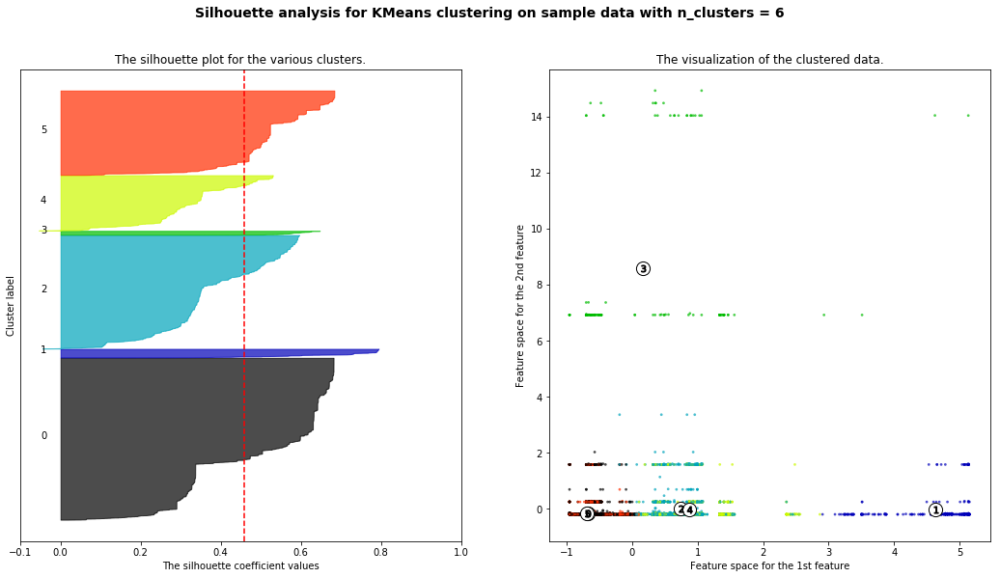

For n_clusters = 7 The average silhouette_score is : 0.4927363652


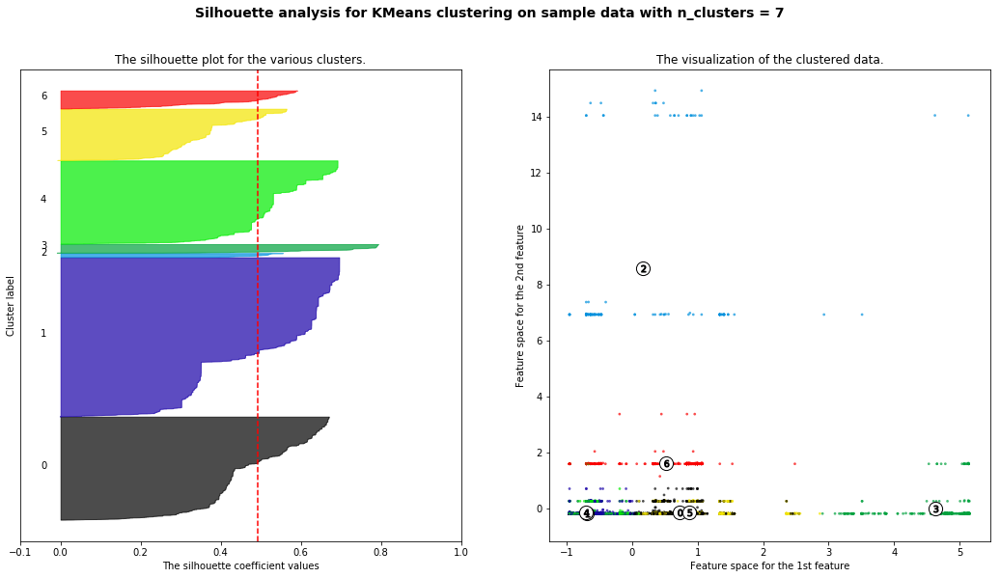

For n_clusters = 8 The average silhouette_score is : 0.495085079516


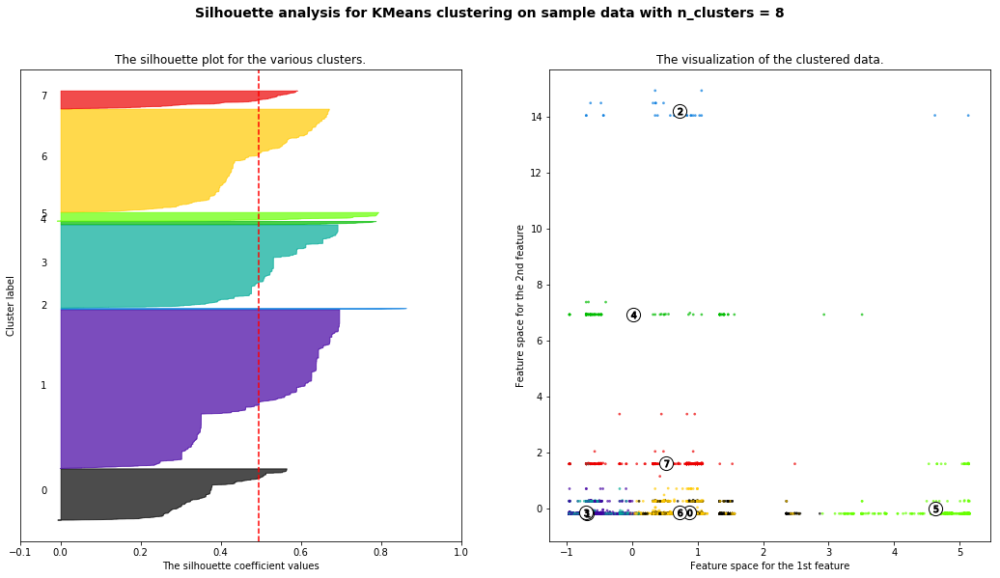

For n_clusters = 9 The average silhouette_score is : 0.489374700292


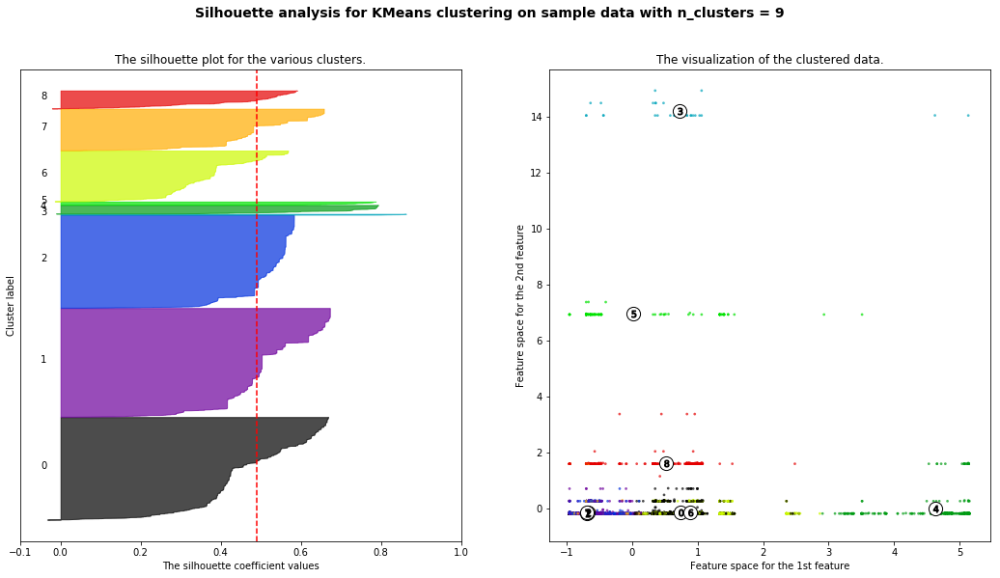

For n_clusters = 10 The average silhouette_score is : 0.478608907509


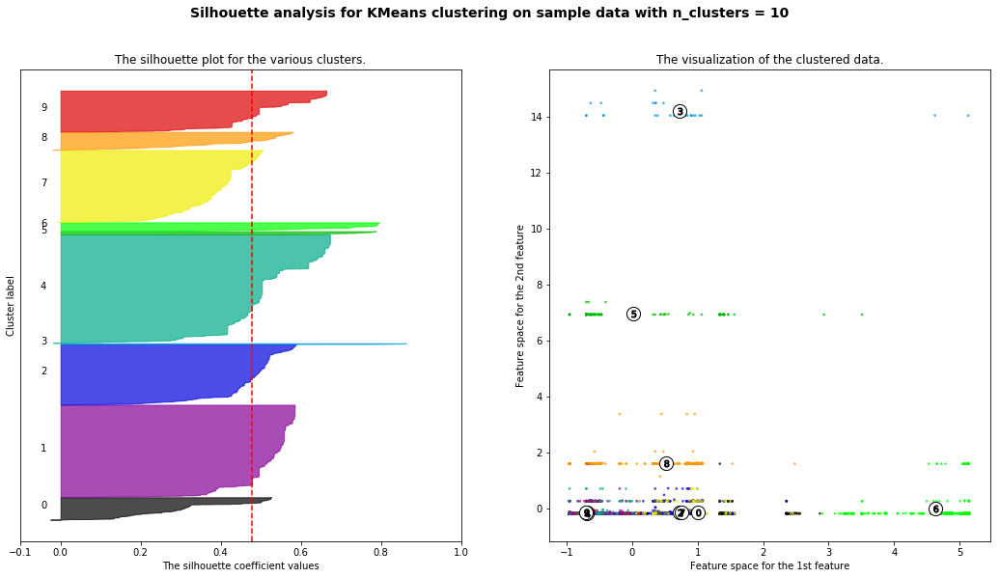

In [22]:
silhoute(sample,[5,6,7,8,9,10])

In [23]:
hartigan_K(sample)

53

In [ ]:
silhoute(sample,[53])

For n_clusters = 53 The average silhouette_score is : 0.621235341094


In [29]:
label = kme(sample,53)
plot(sample.Amenties,sample.Food,sample.stars,label)

### Now lets combine them all 

In [30]:
standard["average"] = data.average_hours
standard["price"] = data.pricelevel

In [31]:
standard

,Amenties,Food,stars,average,price
0,0.870595,-0.195229,4.5,3.500000,0.0
1,-0.506746,-0.195229,4.5,10.700000,0.0
2,-0.570864,-0.195229,4.0,10.200000,1.0
3,0.361633,-0.195201,3.5,0.000000,1.0
4,-0.497179,0.249928,3.5,11.250000,1.0
5,-0.696194,-0.194794,3.5,0.000000,0.0
6,-0.950659,-0.194794,2.0,0.000000,0.0
7,-0.633987,-0.195174,3.0,0.000000,1.0
8,1.340353,-0.194794,4.0,16.000000,1.0
9,-0.698104,-0.195229,3.5,11.400000,1.0


In [32]:
sample = standard.sample(frac=.30,random_state=2)

For n_clusters = 5 The average silhouette_score is : 0.40270068813


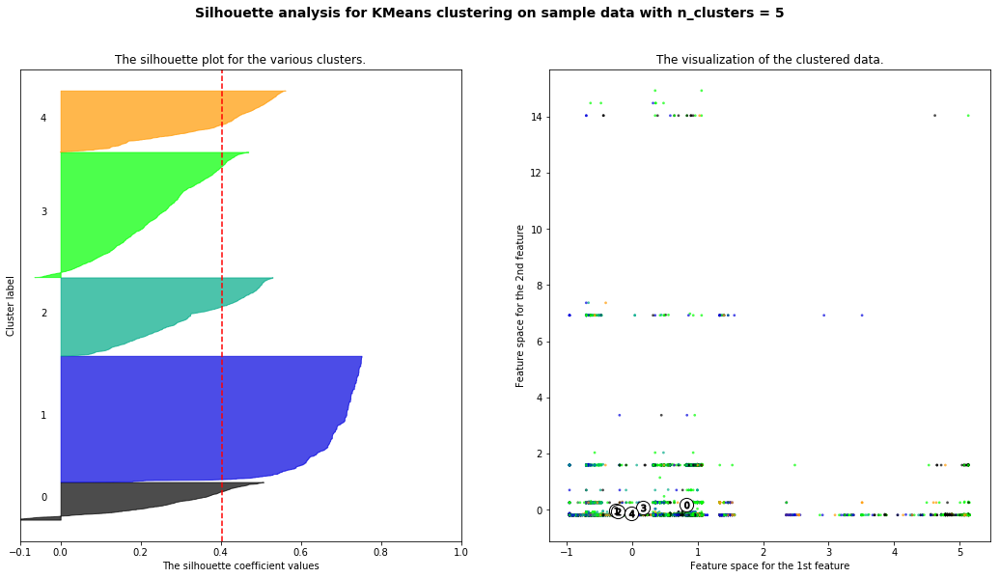

For n_clusters = 6 The average silhouette_score is : 0.406903457172


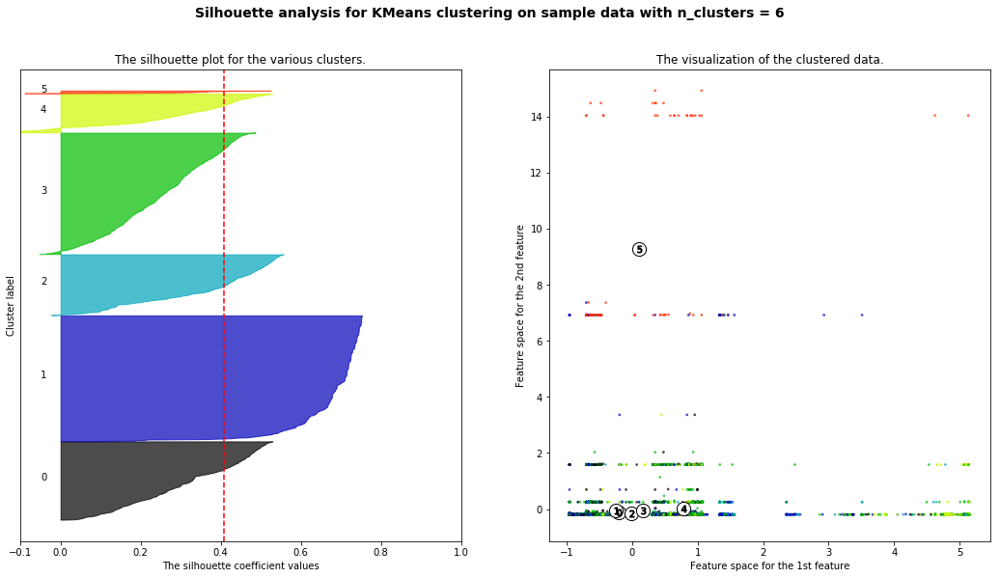

For n_clusters = 7 The average silhouette_score is : 0.399568555186


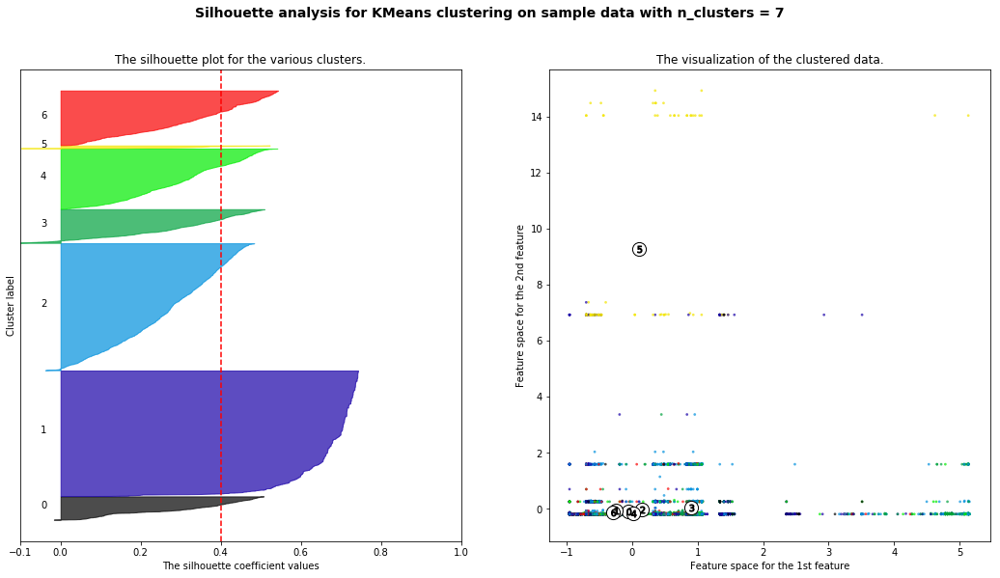

For n_clusters = 8 The average silhouette_score is : 0.38825447539


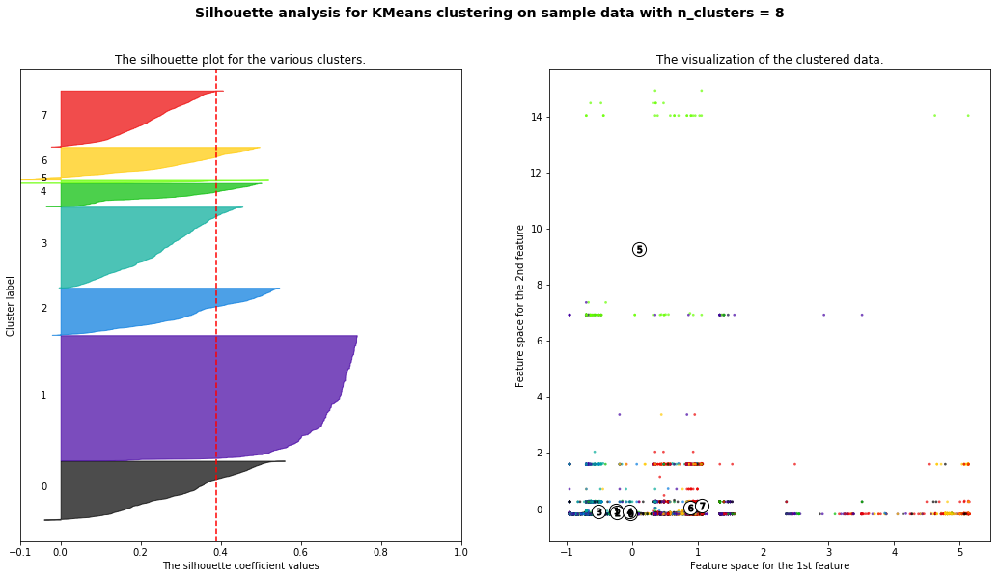

For n_clusters = 9 The average silhouette_score is : 0.3893363581


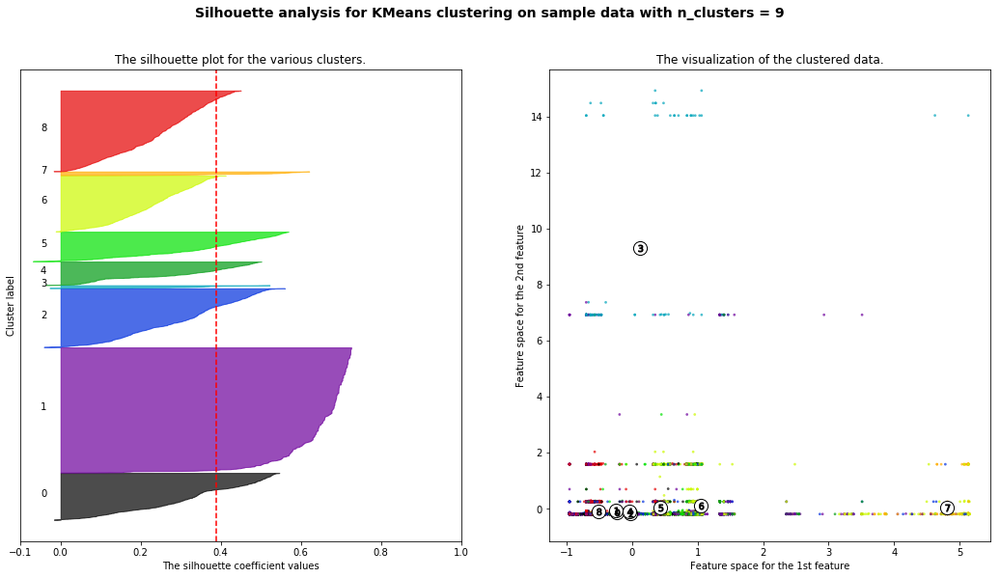

In [33]:
silhoute(sample,[5,6,7,8,9])

In [36]:
hartigan_K(sample)

41

For n_clusters = 41 The average silhouette_score is : 0.395891144632


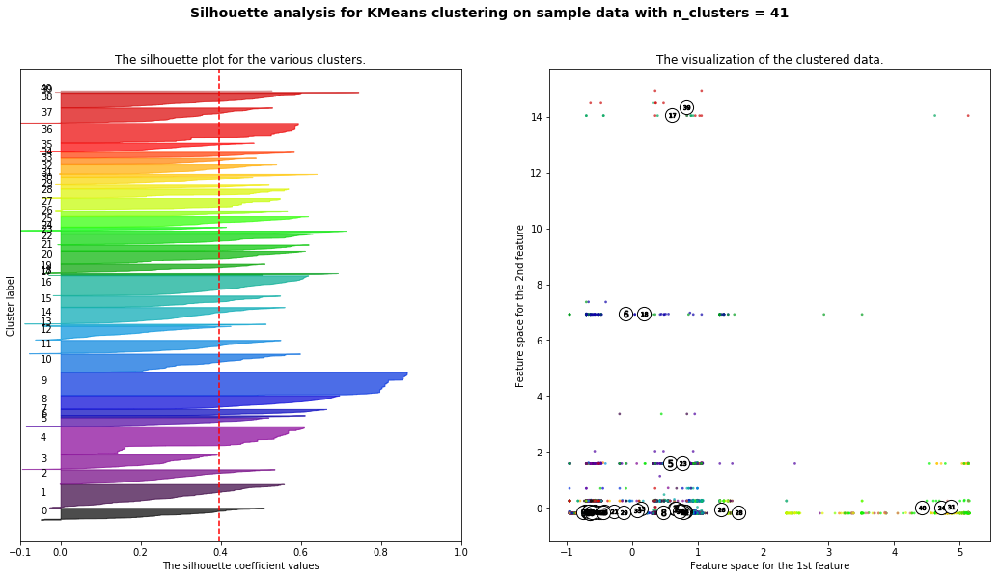

In [44]:
silhoute(sample,[41])

### this time score is not highest but still close

In [42]:
label = kme(sample,5)

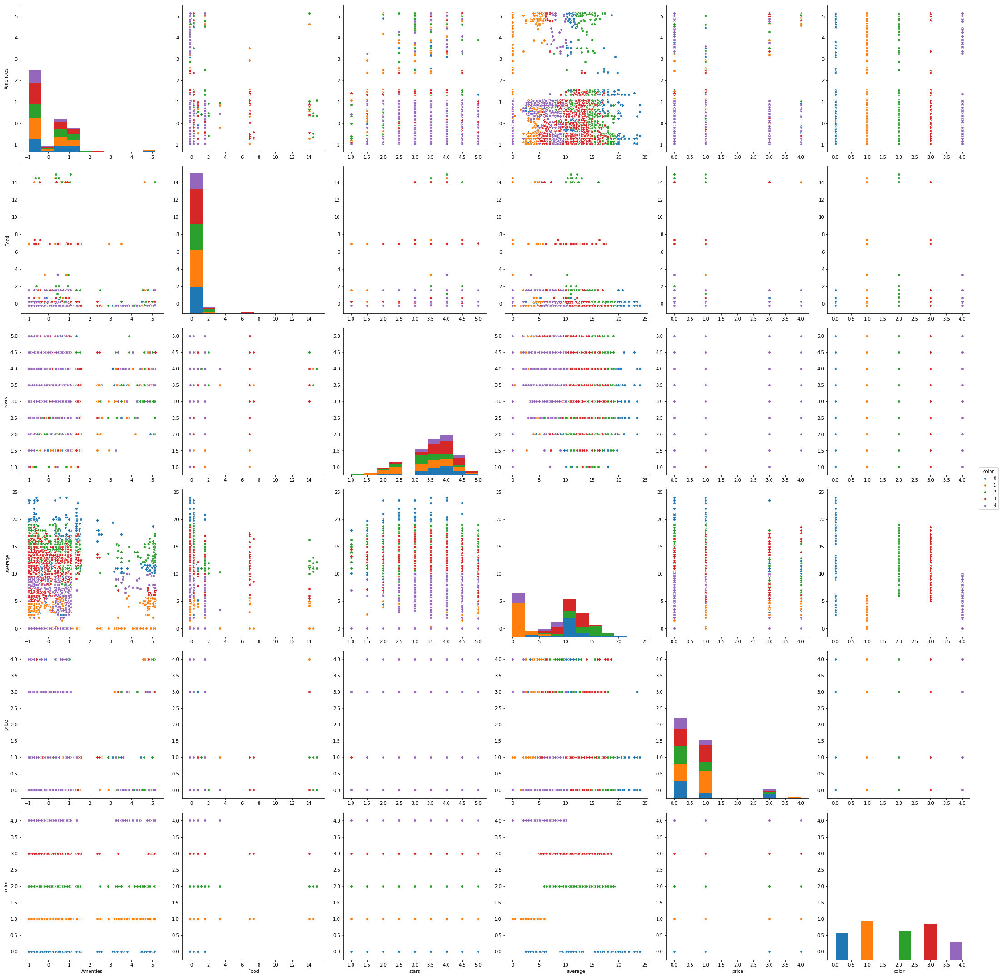

In [43]:
import seaborn as sns
sample["color"] = label
sns.pairplot(sample,hue = "color",size=5)

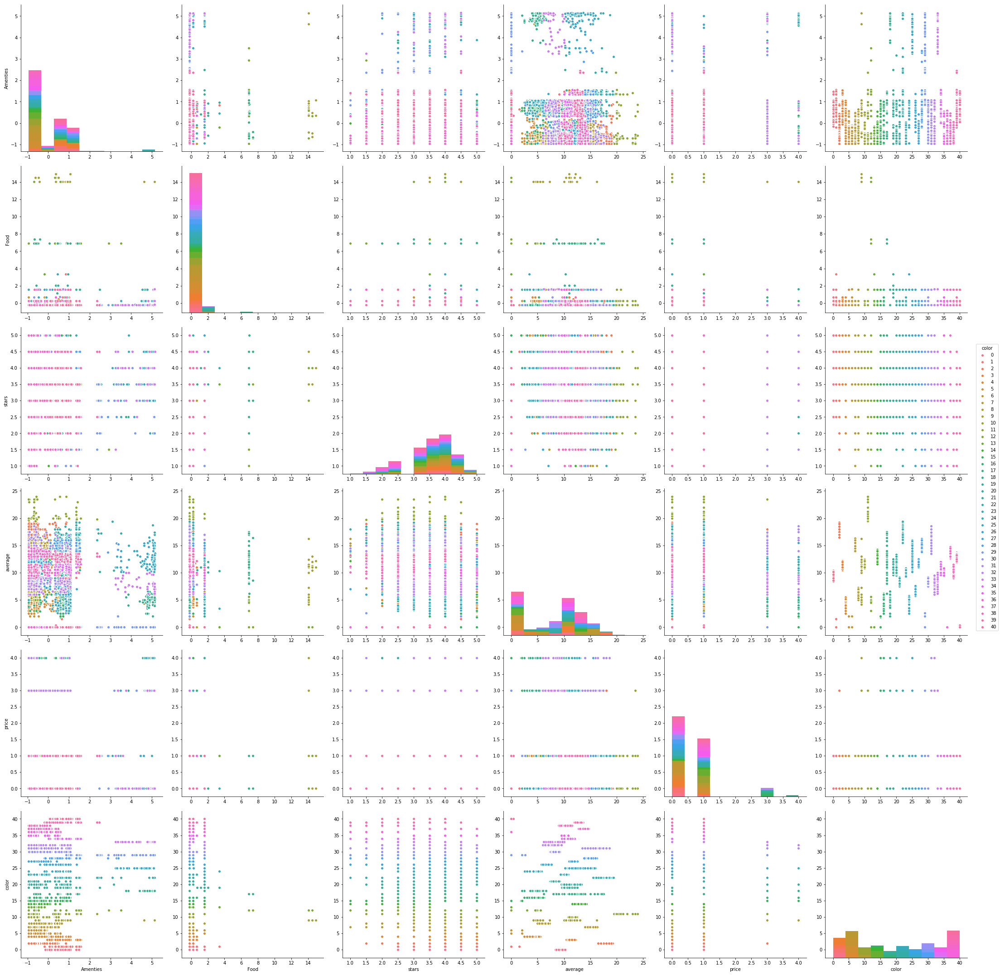

In [45]:
label = kme(sample,41)
sample["color"] = label
sns.pairplot(sample,hue = "color",size=5)

## Thats all in this notebook. Next one is where I have worked with original bcs that data is giving me better score.